

# Intelligence Artificielle 1 : 
## Travail basé sur "BCG Open-Access Data Science & Advanced Analytics Virtual Experience"

### Realised by: Youssef ADARRAB

### Réalisé par: Youssef ADARRAB


In [ ]:
import pandas as pd
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(color_codes=True)

%matplotlib inline

In [ ]:
# Let's load our training data and convert it from CSV to dataframe
# Importation des données et enregistrement du jeu de données sous format CSV

training_data = pd.read_csv('https://raw.githubusercontent.com/youssefadarrab/BCG_Forage_Data_Science_Program/main/data/ml_case_training_data.csv')
history_data = pd.read_csv('https://raw.githubusercontent.com/youssefadarrab/BCG_Forage_Data_Science_Program/main/data/ml_case_training_hist_data.csv')
output_data = pd.read_csv('https://raw.githubusercontent.com/youssefadarrab/BCG_Forage_Data_Science_Program/main/data/ml_case_training_output.csv')


# Summary

## Introduction

## 1- Data Cleaning

### 1.1 Missing values 
### 1.2 Duplicates 
### 1.3 Data types conversions


## 2- Exploratory Data Analysis

### 2.1 Variable identification
### 2.2 Statistical summary
### 2.3 Graphical Univariate Analysis and Outliers
### 2.4 Bivariate Analysis
### 2.6 Correlation analysis

## 3- Feature Engineering 

### 3.1 Creating new features
### 3.2 Target encoding
### 3.3 PCA for Dimensionality Reduction 


## 4- Machine learning models
### 4.1 Split dataset
### 4.2 KNN model
### 4.3 Logistic Regression model
### 4.4 Decision Trees model
### 4.5 Naive Bayes model
### 4.6 SVMs model
### 4.7 Comparison between models

## Conclusion






## Introduction

In our practical case, we are representing a consulting firm, BCG, and we are working as data scientists is order to analyze our client's data, PowerCo, a major gas and electricity utility, that has contacted us to help with the issue of customer churn within the SME segment.
In this notebook, we will try to build a model that predicts the churn based on customer data and historical price data.

We will test several Machine Learning models and then compare their results, and then determine if price sensitivity is the factor that drives customers to churn.


Dans notre cas de travaux pratiques, nous représentons un cabinet de conseil, BCG, et nous travaillons en tant que data scientists afin d'analyser les données de notre client, PowerCo, une importante compagnie de gaz et d'électricité, qui nous a contacté pour l'aider à résoudre le problème du "churn", ou la résiliation des clients dans le segment des PME.
Dans ce notebook, nous allons essayer de construire un modèle qui prédit le taux de désabonnement en se basant sur les données des clients et les données historiques des prix. 

Nous allons tester plusieurs modèles de Machine Learning puis comparer leurs résultats, puis nous déterminerons si la sensibilité aux prix est le facteur qui pousse les clients au churn.



## 1- Data cleaning 
### 1.1 Missing values

We will deal in this part with missing values, to be able to do feature engineering on our dataset

In [ ]:
# Check how many missing values we have in %
n_rows_training = training_data.shape[0]

print(training_data.isnull().sum()*100/n_rows_training)

n_rows_history = history_data.shape[0]
print(history_data.isnull().sum()*100/n_rows_history)





id                            0.000000
activity_new                 59.300447
campaign_disc_ele           100.000000
channel_sales                26.205268
cons_12m                      0.000000
cons_gas_12m                  0.000000
cons_last_month               0.000000
date_activ                    0.000000
date_end                      0.012425
date_first_activ             78.205765
date_modif_prod               0.975398
date_renewal                  0.248509
forecast_base_bill_ele       78.205765
forecast_base_bill_year      78.205765
forecast_bill_12m            78.205765
forecast_cons                78.205765
forecast_cons_12m             0.000000
forecast_cons_year            0.000000
forecast_discount_energy      0.782803
forecast_meter_rent_12m       0.000000
forecast_price_energy_p1      0.782803
forecast_price_energy_p2      0.782803
forecast_price_pow_p1         0.782803
has_gas                       0.000000
imp_cons                      0.000000
margin_gross_pow_ele     

We have printed the percentage of the missing values for every column in our training dataset. We can directly drop the columns that have more than 50% of their values missing.

Nous avons affiché le pourcentage de valeurs manquantes pour chaque colonne de notre jeu de données d'entraînement. Nous pouvons directement éliminer les colonnes qui ont plus de 50% de leurs valeurs manquantes.



In [ ]:
#Drop the columns with 50% or more missing values
training_data.drop(['activity_new', 'campaign_disc_ele', 'date_first_activ', 'forecast_base_bill_ele',
                    'forecast_base_bill_year', 'forecast_bill_12m', 'forecast_cons', 'origin_up'], axis=1, inplace=True)

training_data.isnull().sum()


id                             0
channel_sales               4218
cons_12m                       0
cons_gas_12m                   0
cons_last_month                0
date_activ                     0
date_end                       2
date_modif_prod              157
date_renewal                  40
forecast_cons_12m              0
forecast_cons_year             0
forecast_discount_energy     126
forecast_meter_rent_12m        0
forecast_price_energy_p1     126
forecast_price_energy_p2     126
forecast_price_pow_p1        126
has_gas                        0
imp_cons                       0
margin_gross_pow_ele          13
margin_net_pow_ele            13
nb_prod_act                    0
net_margin                    15
num_years_antig                0
pow_max                        3
dtype: int64

We notice that the column "channel_sales" has the biggest number of missing values. The column corresponds to the code of the sales channel. We can impute the data with the most common value in the column, the mode. We will also use this technique for non numerical columns.

For the remaining numerical columns, since the missing values are less higher we will use the mean imputer.

Finally for the history_data with the prices for each period, there are not many missing values, we will use mean imputing to address missing values.

Nous remarquons que la colonne "channel_sales" a le plus grand nombre de valeurs manquantes. Cette colonne correspond au code du canal de vente. Nous pouvons imputer les données avec la valeur la plus courante de la colonne, c'est-à-dire le mode. Nous allons utiliser cette même technique pour les variables non nuémriques comme les dates.

Pour les autres colonnes qui sont numériques, puisque les valeurs manquantes sont moins élevées, nous utiliserons l'imputeur par la moyenne.

Enfin pour history_data contenant les prix pour chaque période, il n'y a pas beaucoup de valeurs manquantes, nous utiliserons l'imputation moyenne pour les traiter.

In [ ]:
# Impute missing values for non numerical features with the mode 
for col in ['channel_sales', 'date_end', 'date_modif_prod', 'date_renewal']:
    training_data[col] = training_data[col].fillna(training_data[col].mode().iloc[0])

# Impute missing values for non numerical features with the mean 
training_data.fillna(training_data.mean(), inplace=True)
history_data.fillna(history_data.mean(), inplace=True)

# Check if there are other remaining missing values
print(training_data.isnull().sum().sum() == 0)
print(history_data.isnull().sum().sum() == 0)


True
True


### 1.2 Duplicates 

The next step is to check if there are duplicates in the rows of our dataset. If so let's delete them.

La prochaine étape est de vérifier s'il y a des valeurs dupliquées dans les lignes de notre dataset. Si c'est le cas, nous les supprimerons. 

In [ ]:
# Check if there are any duplicates
training_data.duplicated().sum()
history_data.duplicated().sum()

0

We notice that there are no duplicates in our training and history dataset, all the rows are unique. Let's continue !

On remarque qu'il n'y a pas de duplicat dans nos dataset de training et de history, toutes les lignes sont uniques. On peut continuer !

### 1.3 Data types conversions


In [ ]:
# Verify the types of our variables
# Vérifier le type des variables

training_data.dtypes


id                           object
channel_sales                object
cons_12m                      int64
cons_gas_12m                  int64
cons_last_month               int64
date_activ                   object
date_end                     object
date_modif_prod              object
date_renewal                 object
forecast_cons_12m           float64
forecast_cons_year            int64
forecast_discount_energy    float64
forecast_meter_rent_12m     float64
forecast_price_energy_p1    float64
forecast_price_energy_p2    float64
forecast_price_pow_p1       float64
has_gas                      object
imp_cons                    float64
margin_gross_pow_ele        float64
margin_net_pow_ele          float64
nb_prod_act                   int64
net_margin                  float64
num_years_antig               int64
pow_max                     float64
dtype: object

In [ ]:
history_data.dtypes

id               object
price_date       object
price_p1_var    float64
price_p2_var    float64
price_p3_var    float64
price_p1_fix    float64
price_p2_fix    float64
price_p3_fix    float64
dtype: object

We notice here that there are some columns have object as their datatype, we have to convert the datatype to either string, date or boolean. For the other columns, int64 or float64 is fine for the analysis.

Nous remarquons ici que certaines colonnes ont pour type de données objet, nous devons convertir le type de données en chaîne de caractères, date ou booléen. Pour les autres colonnes, int64 ou float64 sont parfaits pour la suite de notre analyse. 

In [ ]:
# Convert the object column to the correct datatype
import datetime

training_data['id'] = training_data['id'].astype('string')
training_data['channel_sales'] = training_data['channel_sales'].astype('string')

training_data['date_activ'] = training_data['date_activ'].astype({'date_activ': 'datetime64[ns]'})
training_data['date_end'] = training_data['date_end'].astype({'date_end': 'datetime64[ns]'})
training_data['date_modif_prod'] = training_data['date_modif_prod'].astype({'date_modif_prod': 'datetime64[ns]'})
training_data['date_renewal'] = training_data['date_renewal'].astype({'date_renewal': 'datetime64[ns]'})

training_data['has_gas'] = training_data['has_gas'].astype(bool)

training_data.dtypes

id                                  string
channel_sales                       string
cons_12m                             int64
cons_gas_12m                         int64
cons_last_month                      int64
date_activ                  datetime64[ns]
date_end                    datetime64[ns]
date_modif_prod             datetime64[ns]
date_renewal                datetime64[ns]
forecast_cons_12m                  float64
forecast_cons_year                   int64
forecast_discount_energy           float64
forecast_meter_rent_12m            float64
forecast_price_energy_p1           float64
forecast_price_energy_p2           float64
forecast_price_pow_p1              float64
has_gas                               bool
imp_cons                           float64
margin_gross_pow_ele               float64
margin_net_pow_ele                 float64
nb_prod_act                          int64
net_margin                         float64
num_years_antig                      int64
pow_max    

In [ ]:
history_data['id'] = history_data['id'].astype('string')
history_data['price_date'] = history_data['price_date'].astype({'price_date': 'datetime64[ns]'})


All the columns are now in a valid datatype and we are ready to pursue further analysis on our new formatted dataset.

Toutes les colonnes sont affectées au bon type de données, on est prêt à continuer notre analyse sur notre dataset actuellement au bon format.

## 2- Exploratory Data Analysis

### 2.1 Variable identification

The very first step in exploratory data analysis is to identify the type of variables in the dataset.
We will see if they are numerical, categorical, ordinal, nominal, discrete or continuous.

La toute première étape de l'analyse exploratoire des données consiste à identifier le type de variables dans l'ensemble de données.
Nous verrons si elles sont numériques, catégoriques, ordinales, nominales, discrètes ou continues.

In [ ]:
training_data.head()

,id,channel_sales,cons_12m,cons_gas_12m,cons_last_month,date_activ,date_end,date_modif_prod,date_renewal,forecast_cons_12m,...,forecast_price_energy_p2,forecast_price_pow_p1,has_gas,imp_cons,margin_gross_pow_ele,margin_net_pow_ele,nb_prod_act,net_margin,num_years_antig,pow_max
0,48ada52261e7cf58715202705a0451c9,lmkebamcaaclubfxadlmueccxoimlema,309275,0,10025,2012-11-07,2016-11-06,2012-11-07,2015-11-09,26520.30,...,0.088347,58.995952,True,831.8,-41.76,-41.76,1,1732.36,3,180.000
1,24011ae4ebbe3035111d65fa7c15bc57,foosdfpfkusacimwkcsosbicdxkicaua,0,54946,0,2013-06-15,2016-06-15,2015-11-01,2015-06-23,0.00,...,0.098142,40.606701,True,0.0,25.44,25.44,2,678.99,3,43.648
2,d29c2c54acc38ff3c0614d0a653813dd,foosdfpfkusacimwkcsosbicdxkicaua,4660,0,0,2009-08-21,2016-08-30,2009-08-21,2015-08-31,189.95,...,0.000000,44.311378,True,0.0,16.38,16.38,1,18.89,6,13.800
3,764c75f661154dac3a6c254cd082ea7d,foosdfpfkusacimwkcsosbicdxkicaua,544,0,0,2010-04-16,2016-04-16,2010-04-16,2015-04-17,47.96,...,0.087899,44.311378,True,0.0,28.60,28.60,1,6.60,6,13.856
4,bba03439a292a1e166f80264c16191cb,lmkebamcaaclubfxadlmueccxoimlema,1584,0,0,2010-03-30,2016-03-30,2010-03-30,2015-03-31,240.04,...,0.000000,44.311378,True,0.0,30.22,30.22,1,25.46,6,13.200


The id and channel_sales columns are categorical nominal variables, the has_gas column is also categorical nominal, the four dates columns are interval variables and all the remaining columns are numerical variables, including six that are continuous.
We will perform later encoding and feature engineering to transform these categorical columns into numerical ones.

Les colonnes id et channel_sales sont des variables nominales catégorielles, la colonne has_gas est également nominale catégorielle, les quatre colonnes de dates sont des variables d'intervalle et toutes les autres colonnes sont des variables numériques, dont six sont continues.
Nous effectuerons un encodage et du feature engineering pour transformer ces colonnes catégorielles en colonnes numériques.



In [ ]:
history_data.head()

,id,price_date,price_p1_var,price_p2_var,price_p3_var,price_p1_fix,price_p2_fix,price_p3_fix
0,038af19179925da21a25619c5a24b745,2015-01-01,0.151367,0.0,0.0,44.266931,0.0,0.0
1,038af19179925da21a25619c5a24b745,2015-02-01,0.151367,0.0,0.0,44.266931,0.0,0.0
2,038af19179925da21a25619c5a24b745,2015-03-01,0.151367,0.0,0.0,44.266931,0.0,0.0
3,038af19179925da21a25619c5a24b745,2015-04-01,0.149626,0.0,0.0,44.266931,0.0,0.0
4,038af19179925da21a25619c5a24b745,2015-05-01,0.149626,0.0,0.0,44.266931,0.0,0.0


### 2.2 Statistical summary

We will use the Pandas describe() method to obtain some basic statistical details like count, percentiles, mean, std and maximum value of our training dataset.

Nous utiliserons la méthode Pandas describe() pour obtenir quelques détails statistiques de base tels que le nombre, les percentiles, la moyenne, la std et la valeur maximale de notre ensemble de données d'entraînement.

In [ ]:
# Statistical details about our dataset
training_data.describe()

,cons_12m,cons_gas_12m,cons_last_month,forecast_cons_12m,forecast_cons_year,forecast_discount_energy,forecast_meter_rent_12m,forecast_price_energy_p1,forecast_price_energy_p2,forecast_price_pow_p1,imp_cons,margin_gross_pow_ele,margin_net_pow_ele,nb_prod_act,net_margin,num_years_antig,pow_max
count,1.609600e+04,1.609600e+04,1.609600e+04,16096.000000,16096.000000,16096.000000,16096.000000,16096.000000,16096.000000,16096.000000,16096.000000,16096.000000,16096.000000,16096.000000,16096.000000,16096.000000,16096.000000
mean,1.948044e+05,3.191164e+04,1.946154e+04,2370.555949,1907.347229,0.991547,70.309945,0.135901,0.052951,43.533496,196.123447,22.462276,21.460318,1.347788,217.987028,5.030629,20.604131
std,6.795151e+05,1.775885e+05,8.235676e+04,4035.085664,5257.364759,5.140728,79.023251,0.026149,0.048427,5.191810,494.366979,23.691309,27.906072,1.459808,366.571095,1.676101,21.770392
min,-1.252760e+05,-3.037000e+03,-9.138600e+04,-16689.260000,-85627.000000,0.000000,-242.960000,0.000000,0.000000,-0.122184,-9038.210000,-525.540000,-615.660000,1.000000,-4148.990000,1.000000,1.000000
25%,5.906250e+03,0.000000e+00,0.000000e+00,513.230000,0.000000,0.000000,16.230000,0.115237,0.000000,40.606701,0.000000,12.025000,11.950000,1.000000,52.017500,4.000000,12.500000
50%,1.533250e+04,0.000000e+00,9.010000e+02,1179.160000,378.000000,0.000000,19.440000,0.142881,0.085917,44.311378,44.465000,21.090000,21.000000,1.000000,119.900000,5.000000,13.856000
75%,5.022150e+04,0.000000e+00,4.127000e+03,2692.077500,1994.250000,0.000000,131.470000,0.146348,0.098837,44.311378,218.090000,29.640000,29.640000,1.000000,275.735000,6.000000,19.800000
max,1.609711e+07,4.188440e+06,4.538720e+06,103801.930000,175375.000000,50.000000,2411.690000,0.273963,0.195975,59.444710,15042.790000,374.640000,374.640000,32.000000,24570.650000,16.000000,500.000000


In [ ]:
history_data.describe()

,price_p1_var,price_p2_var,price_p3_var,price_p1_fix,price_p2_fix,price_p3_fix
count,193002.000000,193002.000000,193002.000000,193002.000000,193002.000000,193002.000000
mean,0.140991,0.054412,0.030712,43.325546,10.698201,6.455436
std,0.025029,0.049857,0.036207,5.418773,12.810704,7.754831
min,0.000000,0.000000,0.000000,-0.177779,-0.097752,-0.065172
25%,0.125976,0.000000,0.000000,40.728885,0.000000,0.000000
50%,0.145859,0.085100,0.000000,44.266930,0.000000,0.000000
75%,0.151635,0.101673,0.072558,44.444710,24.339581,16.226389
max,0.280700,0.229788,0.114102,59.444710,36.490692,17.458221


We will then merge our training dataframe with the output_data dataframe containing the churn data.

On va ensuite fusionner notre dataframe training avec la dataframe output_data qui contient les données sur el churn.

In [ ]:
# Merge dataset with churn data
train = pd.merge(training_data, output_data, on='id')
train['id'] = train['id'].astype('string')
train.head()

,id,channel_sales,cons_12m,cons_gas_12m,cons_last_month,date_activ,date_end,date_modif_prod,date_renewal,forecast_cons_12m,...,forecast_price_pow_p1,has_gas,imp_cons,margin_gross_pow_ele,margin_net_pow_ele,nb_prod_act,net_margin,num_years_antig,pow_max,churn
0,48ada52261e7cf58715202705a0451c9,lmkebamcaaclubfxadlmueccxoimlema,309275,0,10025,2012-11-07,2016-11-06,2012-11-07,2015-11-09,26520.30,...,58.995952,True,831.8,-41.76,-41.76,1,1732.36,3,180.000,0
1,24011ae4ebbe3035111d65fa7c15bc57,foosdfpfkusacimwkcsosbicdxkicaua,0,54946,0,2013-06-15,2016-06-15,2015-11-01,2015-06-23,0.00,...,40.606701,True,0.0,25.44,25.44,2,678.99,3,43.648,1
2,d29c2c54acc38ff3c0614d0a653813dd,foosdfpfkusacimwkcsosbicdxkicaua,4660,0,0,2009-08-21,2016-08-30,2009-08-21,2015-08-31,189.95,...,44.311378,True,0.0,16.38,16.38,1,18.89,6,13.800,0
3,764c75f661154dac3a6c254cd082ea7d,foosdfpfkusacimwkcsosbicdxkicaua,544,0,0,2010-04-16,2016-04-16,2010-04-16,2015-04-17,47.96,...,44.311378,True,0.0,28.60,28.60,1,6.60,6,13.856,0
4,bba03439a292a1e166f80264c16191cb,lmkebamcaaclubfxadlmueccxoimlema,1584,0,0,2010-03-30,2016-03-30,2010-03-30,2015-03-31,240.04,...,44.311378,True,0.0,30.22,30.22,1,25.46,6,13.200,0


### 2.3 Graphical Univariate Analysis and Outliers
### 2.4 Bivariate Analysis
### 2.6 Correlation analysis

We will perform now graphical univariate analysis, bivariate analysis and correlation analysis by plotting various graphs, such as histograms, box plots and count plots. We will identify and remove outliers. Let's use Automated Visualisation with our csv file to automatically plot all the necessary graphs.

Nous effectuerons maintenant une analyse graphique univariée, une analyse bivariée et une analyse de corrélation en traçant divers graphiques, tels que des histogrammes, des diagrammes en boîte et des diagrammes de comptage. Nous allons identifier et supprimer les valeurs aberrantes. Utilisons la visualisation automatisée avec notre fichier csv pour tracer automatiquement tous les graphiques nécessaires.



     |████████████████████████████████| 96 kB 6.5 MB/s 
Imported AutoViz_Class version: 0.0.81. Call using:
    from autoviz.AutoViz_Class import AutoViz_Class
    AV = AutoViz_Class()
    AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=0,
                            lowess=False,chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30)
Note: verbose=0 or 1 generates charts and displays them in your local Jupyter notebook.
      verbose=2 saves plots in your local machine under AutoViz_Plots directory and does not display charts.
Shape of your Data Set: (16096, 32)
############## C L A S S I F Y I N G  V A R I A B L E S  ####################
Classifying variables in data set...
    Number of Numeric Columns =  15
    Number of Integer-Categorical Columns =  6
    Number of String-Categorical Columns =  1
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  1
    Number of Numeric-Boolean Columns =  0
    Number of Discrete 

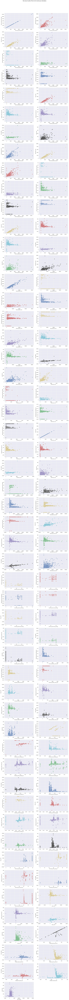

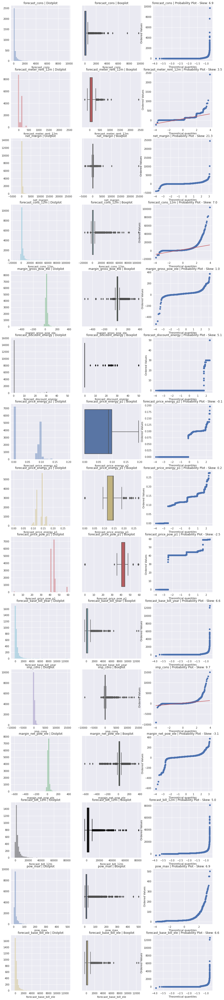

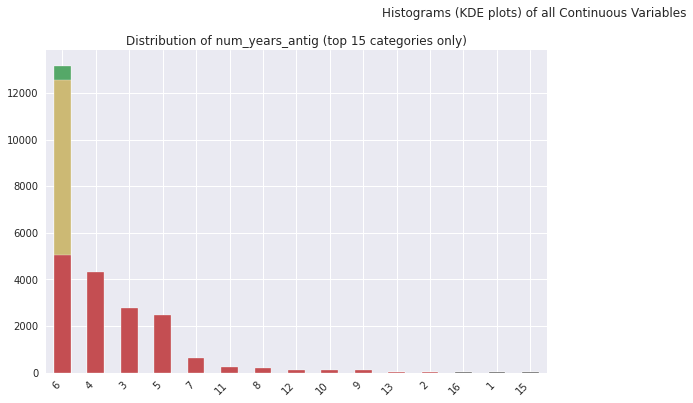

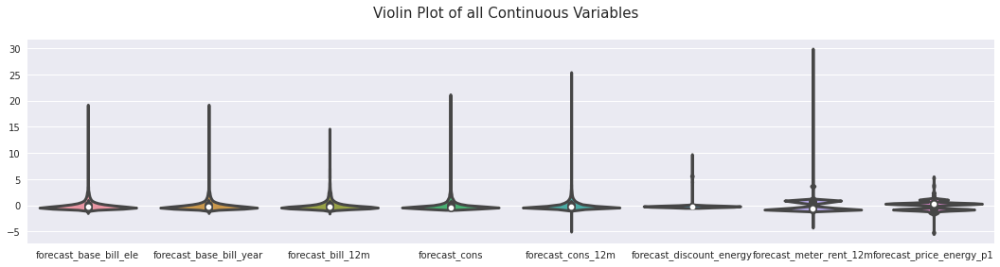

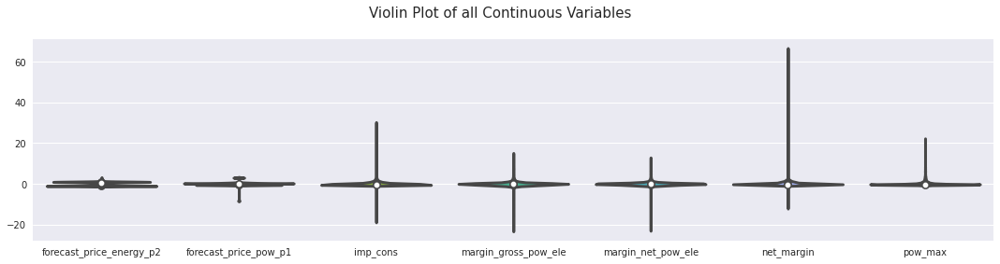

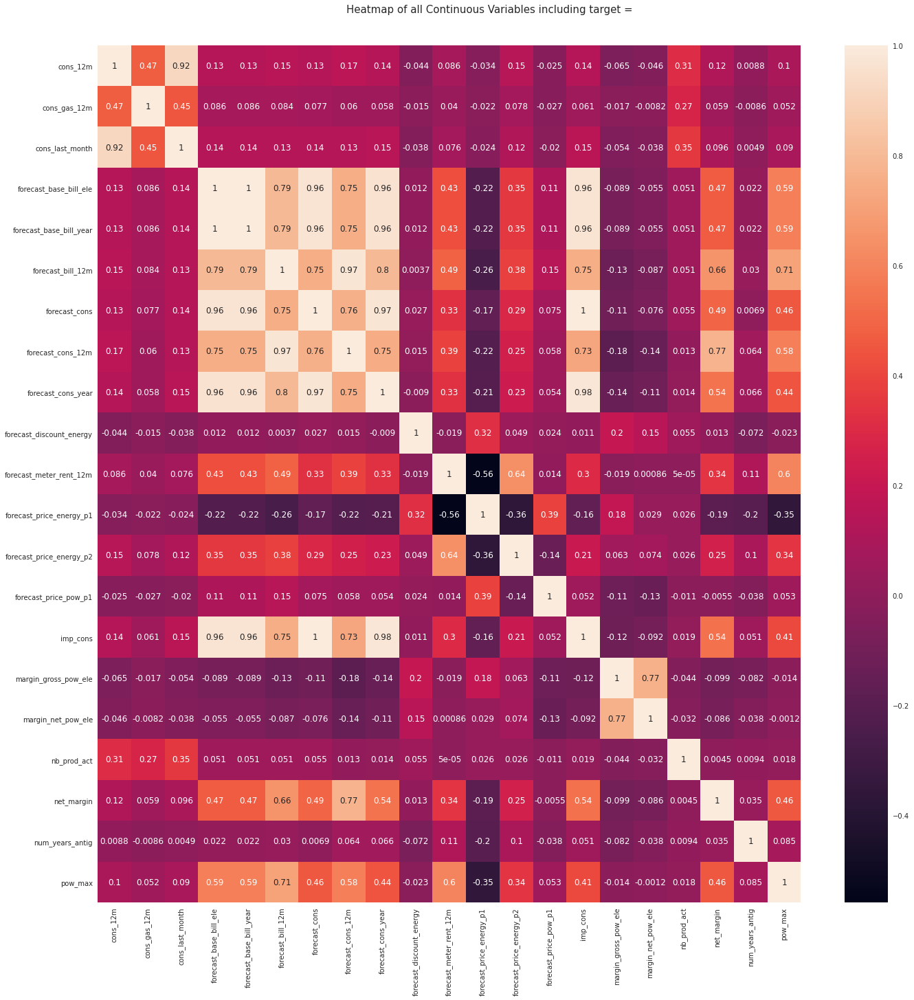

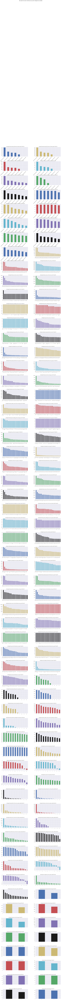

Time to run AutoViz (in seconds) = 83.731

 ###################### VISUALIZATION Completed ########################


In [ ]:
# Automatic EDA 
!pip install xlrd
!pip install autoviz
from autoviz.AutoViz_Class import AutoViz_Class
AV = AutoViz_Class()
df = AV.AutoViz('https://raw.githubusercontent.com/youssefadarrab/BCG_Forage_Data_Science_Program/main/data/ml_case_training_data.csv')

After taking a look at our correlation heatmap, we notice that imp_cons and forecast_cons are very high correlated variables, with a correlation of 1, they provide the same information, so we will drop the column forecast_cons. Since the column had many missing values, we already dropped it, so we didn't lose any valuable informations when deleting the forecast_cons column.

Après avoir observé notre heatmap de corrélation, nous remarquons que imp_cons et forecast_cons sont des variables très fortement corrélées, avec une corrélation de 1. Elles fournissent les mêmes informations, nous allons donc abandonner la colonne forecast_cons. Vu que le colonne avait de nombreuses valeurs manquantes, on l'a déjà supprimée, on n'a donc pas perdu d'informations importantes.

Let's use a method to remove every row which contains an outlier for at leat one column.

On va maintenant utilser une méthode pour supprimer chaque ligne qui contient un outlier dans au moins une colonne.

In [ ]:
# Remove outliers
from scipy import stats
float_columns = [col for col in train.columns if train[col].dtype == 'float64']
train = train[(np.abs(stats.zscore(train[float_columns])) < 3).all(axis=1)]

train.shape

(14459, 25)

After executing our function on the float columns, we see that we went from 16096 rows to 14459 rows, removing 1636 outliers.

Après avoir exécuté notre fonction, on est passés de 16096 lignes à 14459, supprimant ainsi 1636 outliers.


## 3- Feature Engineering
### 3.1 Creating new features

In this first part we will use feature engineering to create new features from our date columns in order to have more meaningful insights.

Dans cette partie on va utiliser le feature engineering afin de créer de nouvelles variables basées sur les colonnes de type date afin d'obtenir de meilleurs insights.



The new feature will be derived from the date_activ and date_end columns, which describe the date of the activation of the contract and the date of the end of the contract. The new feature will then be the substraction of the end and the activation of the contract. This will give us the duration of the contract.

La nouvelle variable sera dérivée des colonnes date_activ et date_end, qui décrivent la date d'activation du contrat et la date de fin du contrat. La nouvelle caractéristique sera alors la soustraction de la fin et de l'activation du contrat. Cela nous donnera la durée du contrat.



In [ ]:
# Create new feature duration
train['duration'] = (train['date_end'] - train['date_activ']).dt.days
print(train['duration'])

1        1096
2        2566
3        2192
4        2192
5        2192
         ... 
16091    1445
16092    1461
16093    1460
16094    1461
16095    2556
Name: duration, Length: 14459, dtype: int64


In [ ]:
# Drop dates columns
train.drop(['date_activ', 'date_end', 'date_modif_prod', 'date_renewal'], axis=1, inplace=True)

After deleting the date columns we still have to deal with the non numerical categorical column to have a ready dataset. For this we will use encoding.

Après avoir supprimé les colonnes de dates, nous devons encore traiter les colonnes catégorielles non numériques pour avoir un jeu de données prêt à l'emploi. Pour cela, nous allons utiliser l'encodage.

The has_gas column in a boolean column, we will transform the True and False values into 0 and 1 values.

La colonne has_gas étant une colonne booléenne, nous allons transformer les valeurs True et False en valeurs 0 et 1.

In [ ]:
# Map boolean values into 0 and 1
train['has_gas'] = train['has_gas'].astype('int64')

### 3.2 Target encoding



The last column to be encoded is the channel_sales column. We will use target encoding.

La dernière colonne à encoder est la colonne channel_sales. Nous allons utiliser le Target Encoding.

In [ ]:
# Target encoding for the channel_sales column
train['channel_sales_encoded'] = train.groupby('channel_sales')['churn'].transform("mean")
train.drop('channel_sales', inplace=True, axis=1)

We performed well the target encoding on the channel_sales column. We will now perform PCA on our data.

On a réussi avec succès le target encodage  sur la colonne channel_sales. On va ensuite effectuer une ACP sur nos données.

### 3.3 PCA for Dimensionality Reduction

Let's try now PCA, we will begin by scaling our data then we will perform our PCA.

On va maintenant effectuer une normalisation des données avant d'essayer l'ACP.

In [ ]:
features = ['cons_12m', 'cons_gas_12m', 'cons_last_month',
       'forecast_cons_12m', 'forecast_cons_year', 'forecast_discount_energy',
       'forecast_meter_rent_12m', 'forecast_price_energy_p1',
       'forecast_price_energy_p2', 'forecast_price_pow_p1',
       'imp_cons', 'margin_gross_pow_ele', 'margin_net_pow_ele', 'nb_prod_act',
       'net_margin', 'num_years_antig', 'pow_max', 'churn', 'duration',
       'channel_sales_encoded']

In [ ]:
X = train.copy()
X = X.loc[:, features]

# Standardize
X_scaled = (X - X.mean(axis=0)) / X.std(axis=0)


In [ ]:
X_scaled.describe()

,cons_12m,cons_gas_12m,cons_last_month,forecast_cons_12m,forecast_cons_year,forecast_discount_energy,forecast_meter_rent_12m,forecast_price_energy_p1,forecast_price_energy_p2,forecast_price_pow_p1,imp_cons,margin_gross_pow_ele,margin_net_pow_ele,nb_prod_act,net_margin,num_years_antig,pow_max,churn,duration,channel_sales_encoded
count,1.445900e+04,14459.000000,1.445900e+04,1.445900e+04,1.445900e+04,1.445900e+04,1.445900e+04,1.445900e+04,1.445900e+04,1.445900e+04,1.445900e+04,1.445900e+04,1.445900e+04,1.445900e+04,1.445900e+04,1.445900e+04,1.445900e+04,1.445900e+04,1.445900e+04,1.445900e+04
mean,-2.162244e-17,0.000000,-2.260527e-17,-2.555379e-17,3.145082e-17,-1.867392e-17,-1.640111e-16,-1.766651e-15,1.867392e-16,-5.096015e-16,5.159900e-17,-4.324487e-17,3.833068e-17,-1.375973e-17,2.850230e-17,2.211386e-16,-2.850230e-17,-4.177062e-17,-1.041808e-16,-2.122930e-16
std,1.000000e+00,1.000000,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
min,-3.131081e-01,-0.195932,-1.473451e+00,-2.546177e+00,-4.807097e+00,-5.906545e-02,-3.029014e+00,-2.179678e+00,-1.068393e+00,-2.492987e+00,-4.759125e+00,-4.945266e+00,-5.596973e+00,-2.316118e-01,-4.813936e+00,-2.481499e+00,-1.674850e+00,-3.281878e-01,-2.723837e+00,-5.358157e+00
25%,-2.775718e-01,-0.179091,-2.540764e-01,-6.525765e-01,-5.917146e-01,-5.906545e-02,-7.851919e-01,-1.059685e+00,-1.068393e+00,-9.086694e-01,-6.164804e-01,-6.190770e-01,-6.179122e-01,-2.316118e-01,-6.891071e-01,-6.298514e-01,-5.012119e-01,-3.281878e-01,-9.150943e-01,3.226857e-02
50%,-2.643175e-01,-0.179091,-2.429215e-01,-3.560985e-01,-4.431681e-01,-5.906545e-02,-7.336865e-01,4.059061e-01,6.927449e-01,2.533702e-01,-4.452676e-01,-3.577058e-02,-3.464658e-02,-2.316118e-01,-3.652855e-01,-1.263545e-02,-3.628247e-01,-3.281878e-01,-2.368160e-01,5.038846e-01
75%,-2.198439e-01,-0.179091,-2.050804e-01,2.626047e-01,1.856931e-01,-5.906545e-02,1.183307e+00,5.630109e-01,1.000295e+00,2.533702e-01,2.171756e-01,5.210219e-01,5.207046e-01,-2.316118e-01,3.273439e-01,6.045805e-01,2.080736e-01,-3.281878e-01,6.114445e-01,5.038846e-01
max,9.105611e+00,23.046675,1.003618e+01,5.847763e+00,8.093334e+00,7.417555e+01,4.085235e+00,3.940873e+00,1.785160e+00,4.876811e+00,6.384251e+00,5.314887e+00,5.302161e+00,2.100716e+01,5.633624e+00,6.159524e+00,6.975371e+00,3.046825e+00,6.245611e+00,5.038846e-01


In [ ]:
import plotly.express as px
from sklearn.decomposition import PCA

# Apply PCA on the dataset
pca = PCA(n_components=12)
components = pca.fit_transform(X_scaled)


We define next a function to plot the explained and cumulative variance for our PCA.

Nous définissons ensuite une fonction permettant de tracer la variance expliquée et cumulative pour notre ACP.

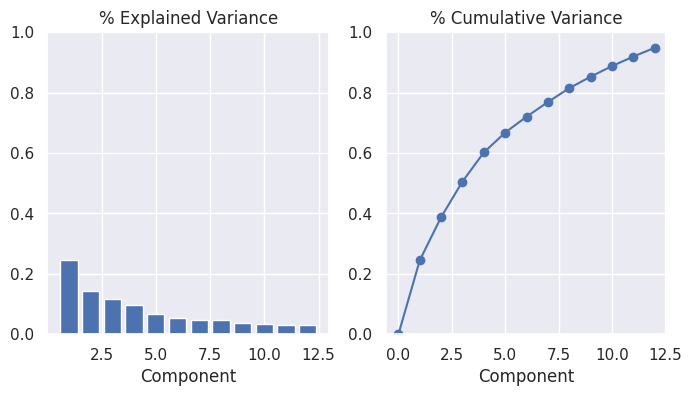

In [ ]:
# Define function to plot variance
def plot_variance(pca, width=8, dpi=100):
    # Create figure
    fig, axs = plt.subplots(1, 2)
    n = pca.n_components_
    grid = np.arange(1, n + 1)
    # Explained variance
    evr = pca.explained_variance_ratio_
    axs[0].bar(grid, evr)
    axs[0].set(
        xlabel="Component", title="% Explained Variance", ylim=(0.0, 1.0)
    )
    # Cumulative Variance
    cv = np.cumsum(evr)
    axs[1].plot(np.r_[0, grid], np.r_[0, cv], "o-")
    axs[1].set(
        xlabel="Component", title="% Cumulative Variance", ylim=(0.0, 1.0)
    )
    # Set up figure
    fig.set(figwidth=8, dpi=100)
    return axs

# Plot PCA illustration
plot_variance(pca);


## 4- Machine learning models
### 4.1 Split dataset

Let's split our dataset to train and test our models.

Séparons notre dataset en train et test sous dataset afin d'entraîner et tester nos modèles.

In [ ]:
# Merge the history and train data
train_history = pd.merge(train, history_data, on='id')
X_total = train_history.drop(['price_date', 'id', 'churn'], axis=1)
y_total = train_history.pop('churn')


In [ ]:
print(y_total.shape)
print(X_total.shape)

(173370,)
(173370, 26)


In [ ]:
# Split the data between the training and test data
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_total, y_total, test_size=0.33, random_state=42)


In [ ]:
X_test.head()

,cons_12m,cons_gas_12m,cons_last_month,forecast_cons_12m,forecast_cons_year,forecast_discount_energy,forecast_meter_rent_12m,forecast_price_energy_p1,forecast_price_energy_p2,forecast_price_pow_p1,...,num_years_antig,pow_max,duration,channel_sales_encoded,price_p1_var,price_p2_var,price_p3_var,price_p1_fix,price_p2_fix,price_p3_fix
62590,2587145,0,324254,3214.28,4067,0.0,16.44,0.162033,0.084138,44.311378,...,6,13.8,2192,0.053712,0.168654,0.085390,0.000000,44.444710,0.000000,0.000000
42434,20000,0,2245,2205.91,2245,0.0,130.32,0.116340,0.099998,40.606701,...,4,25.0,1461,0.106385,0.129444,0.106863,0.075004,40.565969,24.339581,16.226389
114468,6791,0,348,701.74,348,0.0,133.02,0.115174,0.098837,40.606701,...,6,15.1,2557,0.106385,0.118312,0.099632,0.071760,40.728885,24.437330,16.291555
51473,43951,0,0,4338.13,0,0.0,111.84,0.115232,0.100123,40.606701,...,5,47.0,2189,0.106385,0.128069,0.105842,0.073773,40.728885,24.437330,16.291555
152419,2724,0,273,410.83,273,0.0,13.78,0.147506,0.000000,45.806878,...,5,15.0,2192,0.106385,0.152445,0.000000,0.000000,44.266930,0.000000,0.000000


### 4.2 KNN model

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
neigh = KNeighborsClassifier(n_neighbors=3, weights='distance')
neigh.fit(X_train, y_train)
y_pred = neigh.predict(X_test)

In [ ]:
# Print the confusion matrix (tp, tn, fp, fn) and the accuracy
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score

y_true = y_test
print(confusion_matrix(y_true, y_pred))


[[51704     0]
 [    0  5509]]


In [ ]:
tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
print('For  the knn algorithm, we have the following results : \ntn:'+ str(tn) + '  ' + 'fp:'+ str(fp) + '  '+'fn:'+ str(fn) + ' tp:'+ str(tp) + ' , meanwhile the accuracy is ' + " " + str(accuracy_score(y_true, y_pred)))
print('The F1 score is ' + str(f1_score(y_true, y_pred, average='macro')))

### 4.3 Logistic regression model

In [ ]:
# Import the LogisticRegression model from scikitlearn
from sklearn.linear_model import LogisticRegression
clf = LogisticRegression(multi_class='multinomial', solver='lbfgs',C=1,
                         penalty='l2', fit_intercept=True, max_iter=30000,
                         random_state=42).fit(X_train, y_train)
y_pred = clf.predict(X_test)


In [ ]:
# Print the confusion matrix (tp, tn, fp, fn) and the accuracy
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score

y_true = y_test
confusion_matrix(y_true, y_pred)

array([[51704,     0],
       [ 5509,     0]])

In [ ]:
tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
print('For 30000 iterations of the Logistic Regression, we have the following results : \ntn:'+ str(tn) + '  ' + 'fp:'+ str(fp) + '  '+'fn:'+ str(fn) + ' tp:'+ str(tp) + ' , meanwhile the accuracy is ' + " " + str(accuracy_score(y_true, y_pred)))
print('The F1 score is ' + str(f1_score(y_true, y_pred, average='macro')))

For 30000 iterations of the Logistic Regression, we have the following results : 
tn:51704  fp:0  fn:5509 tp:0 , meanwhile the accuracy is  0.9037106951217381
The F1 score is 0.4747101003516439


#### Conclusion on our first iteration of work:

We can notice that the accuracy is very high, reaching 0.90, but the F1-score is very poor, only 0.47.
Such a model would not perform well to detect clients who have churned. 
Therefore we have to re-engineer our model to reach better performance.

Nous pouvons remarquer que la précision est très élevée, atteignant 0,90, mais que le score F1 est très faible, seulement 0,47. Un tel modèle ne serait pas très performant pour détecter le churn. Par conséquent, nous devons réorganiser notre modèle pour obtenir de meilleures performances.

### 4.4 Decision Trees and Random Forest algorithms

In [ ]:
# Test Decision Tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import cross_val_score

clf = DecisionTreeClassifier(random_state=0).fit(X_train, y_train)
y_pred = clf.predict(X_test)
scores_accuracy = cross_val_score(clf, X_train, y_train, cv=4, scoring='accuracy')
scores_f1 = cross_val_score(clf, X_train, y_train, cv=4, scoring='f1_macro')

# Print the confusion matrix
y_true = y_test
confusion_matrix(y_true, y_pred)

print(scores_accuracy)
print(scores_f1)


[0.99910468 0.99913909 0.99910465 0.99944902]
[0.99745518 0.99754958 0.99745517 0.99843395]


In [ ]:
# Metrics for the DecisionTrees
tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
print('For the DecisionTrees, we have the following results : \ntn:'+ str(tn) + '  ' + 'fp:'+ str(fp) + '  '+'fn:'+ str(fn) + ' tp:'+ str(tp) + ' , meanwhile the accuracy is ' + " " + str(accuracy_score(y_true, y_pred)))
print('The F1 score is ' + str(f1_score(y_true, y_pred, average='macro')))


For the DecisionTrees, we have the following results : 
tn:51690  fp:14  fn:17 tp:5492 , meanwhile the accuracy is  0.9994581651023369
The F1 score is 0.998442940619131


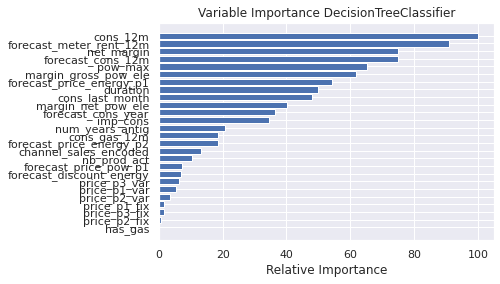

In [ ]:
def plot_importance(model):
    """
    Fuction to plot variable importance from machine learning model.
    Note: the model requires to have "model.feature_importances_".
   
    Inputs
    -------
    - model: a model with a object ".feature_importances_"

    Returns
    -------
    - feature importance plot
   

    """

    feature_importance = model.feature_importances_
    # make importances relative to max importance
    feature_importance = 100.0 * (feature_importance / feature_importance.max())
    sorted_idx = np.argsort(feature_importance)
    pos = np.arange(sorted_idx.shape[0]) + .5
    plt.barh(pos, feature_importance[sorted_idx], align='center')
    plt.yticks(pos, X_train.columns[sorted_idx])
    plt.xlabel('Relative Importance')
    plt.title(f'Variable Importance {model.__class__.__name__}')
    plt.show()

plot_importance(clf)


We notice that the consumption of the clients are the features that influence more the model for the DecisionTreeClassifier, as for the kNN, we obtain a very high accuracy and F1 score.

On remarque que les consommations des clients sont les caractéristiques qui influencent le plus le modèle pour le DecisionTreeClassifier, comme pour le kNN, on obtient une précision et un score F1 très élevés.

In [ ]:
# Test DecisionTrees
from sklearn import tree
clf = tree.DecisionTreeClassifier()
clf = clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)

# Print the confusion matrix
y_true = y_test
confusion_matrix(y_true, y_pred)

!pip install graphviz
import graphviz 
dot_data = tree.export_graphviz(clf, out_file=None)
graph = graphviz.Source(dot_data)
graph.render("Tree") 

 
graph = graphviz.Source(dot_data)  
graph


### 4.5 Naive Bayes model

In [ ]:
# Test Naive Bayes
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()
y_pred = gnb.fit(X_train, y_train).predict(X_test)

# Print the confusion matrix
y_true = y_test
confusion_matrix(y_true, y_pred)

array([[ 7214, 44490],
       [  453,  5056]])

In [ ]:
# Metrics for the Naive Bayes
tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
print('For Naive Bayes, we have the following results : \ntn:'+ str(tn) + '  ' + 'fp:'+ str(fp) + '  '+'fn:'+ str(fn) + ' tp:'+ str(tp) + ' , meanwhile the accuracy is ' + " " + str(accuracy_score(y_true, y_pred)))
print('The F1 score is ' + str(f1_score(y_true, y_pred, average='macro')))


For Naive Bayes, we have the following results : 
tn:7214  fp:44490  fn:453 tp:5056 , meanwhile the accuracy is  0.21446174820407948
The F1 score is 0.2133425704021082


### 4.6 SVMs model

In [ ]:
# Test SVMs
from sklearn import svm
clf = svm.SVC()
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)

# Print the confusion matrix
y_true = y_test
confusion_matrix(y_true, y_pred)

array([[51704,     0],
       [ 5509,     0]])

In [ ]:
# Metrics for the SVMs algorithm
tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
print('For SVMs, we have the following results : \ntn:'+ str(tn) + '  ' + 'fp:'+ str(fp) + '  '+'fn:'+ str(fn) + ' tp:'+ str(tp) + ' , meanwhile the accuracy is ' + " " + str(accuracy_score(y_true, y_pred)))
print('The F1 score is ' + str(f1_score(y_true, y_pred, average='macro')))


For SVMs, we have the following results : 
tn:51704  fp:0  fn:5509 tp:0 , meanwhile the accuracy is  0.9037106951217381
The F1 score is 0.4747101003516439


### 4.7 Comparison between models

Après avoir testé plusieurs modèles, on remarque que pour notre cas d'étude, les performances varient de manière significative en fonction de l'algorithme choisi pour le modèle. 

Indeed, the least performing : Naive Bayes displays an accurary score and F1 score of 21%, which is very low, then come the two algorithms SVMs and Logistic Regression which display the same performances: 90% accuracy and 47% for the F1-score, by examining them more closely, we notice that they just categorize everything as negative. This allows the algorithms to have a good accuracy as the data is unbalanced, but the presence of the F1-score metric allows us to see that the models are not efficient.

Finally, we find the Decision Trees with 99% of accuracy and F1 score as well as the kNN (k nearest neighbors) algorithm which displays a perfect score of 100% on the accuracy and F1 score! This can be explained by the kNN algorithm having a complex non-linear decision boundary curve (curve separating the positive classes from the negative classes) with regions clustered around certain points, thus allowing to isolate the areas where the positive classified points appear.





En effet, le moins performant : Naive Bayes affiche un score accurary et F1 score de 21%, ce qui est très bas, ensuite viennent les deux algorithmes SVMs et Logistic Regression qui affichent les mêmes performances : 90% d'accuracy et 47% pour le F1-score, en les examinant de plus près, on remarque qu'ils se contentent de tout catégoriser en tant que négatif. Ceci permet aux algorithmes d'avoir une bonne accuracy vu que les données sont déséquilibrées, mais la présence de la métrique F1 score nous permet de voir que les modèles ne sont pas efficaces.

Finalement, on trouve les Decision Trees (Arbres de décision) avec 99% de accuracy et F1 score ainsi que l'algorithme des kNN (k plus proches voisins) qui affiche un score parfait de 100% sur l'accuracy et le F1 score ! Ceci peut être expliqué pour l'algorithme des kNN d'avoir un courbe de limite de décision (courbe séparant les classes positives des classes négatives) complexe non linéaire avec des régions regroupées autour de certains points, permettant donc d'isoler les zones où les points classifiés positifs apparaîssent.

## Conclusion

This study allowed us to put several steps of preprocessing of the data, starting from the cleaning of the data with the treatment of the missing values, the duplicates and the conversion of the data types.
    
Then came the stage of exploratory analysis of the data, by analyzing the statistical indicators of our dataset in general, then by performing a univariate and then multivariate graphical analysis based on the study of correlations in order to ensure that there are no highly correlated features that are present in our dataset.

The next step was to perform Feature Engineering by creating new features from the Date columns. The other numerical columns were encoded with TargetEncoding to be able to perform a PCA on our dataset and reduce its dimension.

Finally, the application of the Machine Learning models with the scoring of the relative importance of the features shows us that it is not necessarily the prices and their variations that influence the model the most, so we can conclude that the prices are probably not directly the first cause of the churn.



Cette étude nous a permis de mettre plusieurs étapes de preprocessing des données, en partant du nettoyage des données avec le traitement des valeurs manquantes, des duplicats et la conversion des types de données.
    
Ensuite est venue l'étape de l'analyse exploratoire des données, en analysant les indcateurs statistiques de notre jeu de données en général, puis en effectuant une analyse graphique univarié puis multivariée basée sur l'étude des corrélations afin de s'assurer qu'il n'y a pas de features hautement corrélées qui soient présentes dans notre dataset.

L'étape suivante a consisté à effectuer le Feature Engineering en créant de nouvelles features à partir des colonnes de format Date. Les autres colonnes numériques ont été encodées avec le TargetEncoding pour pouvoir effectuer une ACP sur notre jeu de données et de réduire sa dimension.

Finalement l'application des modèles de Machine Learning avec le scoring de l'importance relative des features nous montre que ce ne sont pas forcément les prix et leurs variations qui influencent le plus le modèle, on peut donc conclure que les prix ne sont probablement pas directement la première cause du churn. 


<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=bd439fa6-d62f-4bbe-b3d6-badd140242f4' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>